Running inference on the test split of a dataset
======================================



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import gdown

url = "https://drive.google.com/file/d/1YCNbKiJHyzgSFoVmf3qhuKy9rothXlJn/view?usp=drive_link"
output = "VBOF.zip"
gdown.download(url, output)

/usr/local/lib/python3.10/dist-packages/gdown/parse_url.py:48: UserWarning: You specified a Google Drive link that is not the correct link to download a file. You might want to try `--fuzzy` option or the following url: https://drive.google.com/uc?id=1YCNbKiJHyzgSFoVmf3qhuKy9rothXlJn
  warnings.warn(
Downloading...
From: https://drive.google.com/file/d/1YCNbKiJHyzgSFoVmf3qhuKy9rothXlJn/view?usp=drive_link
To: /content/VBOF.zip
85.6kB [00:00, 5.10MB/s]


'VBOF.zip'

In [ ]:
!unzip /content/drive/MyDrive/Copy\ of\ PWCNet_OFDark.zip

Archive:  /content/drive/MyDrive/Copy of PWCNet_OFDark.zip
   creating: PWCNet_OFDark/
  inflating: PWCNet_OFDark/pwcnet.ckpt-50000.data-00000-of-00001  
  inflating: PWCNet_OFDark/pwcnet.ckpt-50000.index  
  inflating: PWCNet_OFDark/pwcnet.ckpt-50000.meta  


In [ ]:
!unzip /content/drive/MyDrive/Copy\ of\ VBOF_publish.zip

Archive:  /content/drive/MyDrive/Copy of VBOF_publish.zip
   creating: VBOF_publish/
  inflating: VBOF_publish/README.md  
   creating: VBOF_publish/src/
   creating: VBOF_publish/src/canon/
  inflating: VBOF_publish/src/canon/10_1.jpg  
  inflating: VBOF_publish/src/canon/10_2.jpg  
  inflating: VBOF_publish/src/canon/10_3.jpg  
  inflating: VBOF_publish/src/canon/10_4.jpg  
  inflating: VBOF_publish/src/canon/10_5.jpg  
  inflating: VBOF_publish/src/canon/10_6.jpg  
  inflating: VBOF_publish/src/canon/10_7.jpg  
  inflating: VBOF_publish/src/canon/10_8.jpg  
  inflating: VBOF_publish/src/canon/10_9.jpg  
  inflating: VBOF_publish/src/canon/11_1.jpg  
  inflating: VBOF_publish/src/canon/11_2.jpg  
  inflating: VBOF_publish/src/canon/11_3.jpg  
  inflating: VBOF_publish/src/canon/11_4.jpg  
  inflating: VBOF_publish/src/canon/11_5.jpg  
  inflating: VBOF_publish/src/canon/11_6.jpg  
  inflating: VBOF_publish/src/canon/11_7.jpg  
  inflating: VBOF_publish/src/canon/11_8.jpg  
  inflatin

In [ ]:
!git clone https://github.com/philferriere/tfoptflow.git

Cloning into 'tfoptflow'...
remote: Enumerating objects: 307, done.
remote: Total 307 (delta 0), reused 0 (delta 0), pack-reused 307
Receiving objects: 100% (307/307), 184.92 MiB | 22.98 MiB/s, done.
Resolving deltas: 100% (123/123), done.


In [ ]:
%%shell

cd VBOF_publish
python fill_VBOF_data.py


8 bars in total. To stop, press ctrl+c for 10 secends :)
100% 50/50 [00:17<00:00,  2.89it/s]
100% 16/16 [00:05<00:00,  3.17it/s]
100% 28/28 [00:03<00:00,  7.60it/s]
100% 60/60 [00:10<00:00,  5.64it/s]
100% 34/34 [00:06<00:00,  4.88it/s]
100% 138/138 [00:26<00:00,  5.20it/s]
100% 50/50 [00:09<00:00,  5.15it/s]
100% 50/50 [00:07<00:00,  6.38it/s]


In [ ]:
%%shell
wget http://files.is.tue.mpg.de/sintel/MPI-Sintel-complete.zip

unzip MPI-Sintel-complete.zip -d VBOF_publish/MPI-Sintel

Streaming output truncated to the last 5000 lines.
  inflating: VBOF_publish/MPI-Sintel/training/invalid/ambush_2/frame_0016.png  
  inflating: VBOF_publish/MPI-Sintel/training/invalid/ambush_2/frame_0011.png  
  inflating: VBOF_publish/MPI-Sintel/training/invalid/ambush_2/frame_0007.png  
  inflating: VBOF_publish/MPI-Sintel/training/invalid/ambush_2/frame_0009.png  
   creating: VBOF_publish/MPI-Sintel/training/invalid/cave_2/
  inflating: VBOF_publish/MPI-Sintel/training/invalid/cave_2/frame_0028.png  
  inflating: VBOF_publish/MPI-Sintel/training/invalid/cave_2/frame_0021.png  
  inflating: VBOF_publish/MPI-Sintel/training/invalid/cave_2/frame_0026.png  
  inflating: VBOF_publish/MPI-Sintel/training/invalid/cave_2/frame_0013.png  
  inflating: VBOF_publish/MPI-Sintel/training/invalid/cave_2/frame_0014.png  
  inflating: VBOF_publish/MPI-Sintel/training/invalid/cave_2/frame_0005.png  
  inflating: VBOF_publish/MPI-Sintel/training/invalid/cave_2/frame_0002.png  
  inflating: VBOF_pub

In [ ]:
!cp -r tfoptflow/tfoptflow/* ./

In [ ]:
!pip install tf_slim

In [ ]:
"""
pwcnet_predict.ipynb

Run inference on test split of dataset.

Written by Phil Ferriere

Licensed under the MIT License (see LICENSE for details)
"""

from __future__ import absolute_import, division, print_function
import sys
from copy import deepcopy
from dataset_base import _DEFAULT_DS_TEST_OPTIONS
from dataset_mpisintel import MPISintelDataset
from model_pwcnet import ModelPWCNet, _DEFAULT_PWCNET_TEST_OPTIONS
from visualize import display_img_pairs_w_flows

Instructions for updating:
non-resource variables are not supported in the long term


In [ ]:
# TODO: You MUST set _DATASET_ROOT to the correct path on your machine!
if sys.platform.startswith("win"):
    _DATASET_ROOT = 'E:/datasets/'
else:
    _DATASET_ROOT = './VBOF_publish/'
_MPISINTEL_ROOT = _DATASET_ROOT + 'MPI-Sintel'

# TODO: Set device to use for inference
# Here, we're using a GPU (use '/device:CPU:0' to run inference on the CPU)
gpu_devices = ['/device:GPU:0']
controller = '/device:GPU:0'

# More options...
# Set the number of samples to visually inspect after inference
# Set the path to the trained model (make sure you've downloaded it first from http://bit.ly/tfoptflow)
# Set the batch size
num_samples = 10
ckpt_path = './PWCNet_OFDark/pwcnet.ckpt-50000'
batch_size = 8

In [ ]:
# Load the dataset in inference mode, starting with the default options
ds_opts = deepcopy(_DEFAULT_DS_TEST_OPTIONS)
ds_opts['type'] = 'clean'
ds = MPISintelDataset(mode='test', ds_root=_MPISINTEL_ROOT, options=ds_opts)

# Display dataset configuration
ds.print_config()


Dataset Configuration:
  verbose              False
  in_memory            False
  crop_preproc         None
  scale_preproc        None
  type                 clean
  random_seed          1969
  val_split            0.03
  mode                 test
  test size            552


In [ ]:
# Configure the model for inference, starting with the default options
nn_opts = deepcopy(_DEFAULT_PWCNET_TEST_OPTIONS)
nn_opts['verbose'] = True
nn_opts['ckpt_path'] = ckpt_path
nn_opts['batch_size'] = batch_size
nn_opts['use_tf_data'] = True
nn_opts['gpu_devices'] = gpu_devices
nn_opts['controller'] = controller

# We're running the PWC-Net-large model in quarter-resolution mode
# That is, with a 6 level pyramid, and upsampling of level 2 by 4 in each dimension as the final flow prediction
nn_opts['use_dense_cx'] = True
nn_opts['use_res_cx'] = True
nn_opts['pyr_lvls'] = 6
nn_opts['flow_pred_lvl'] = 2

# The size of the images in this dataset are not multiples of 64, while the model generates flows padded to multiples
# of 64. Hence, we need to crop the predicted flows to their original size
nn_opts['adapt_info'] = (1, 436, 1024, 2)

In [ ]:
# Instantiate the model in inference mode and display the model configuration
nn = ModelPWCNet(mode='test', options=nn_opts, dataset=ds)
nn.print_config()

debug msg 1
1
Building model...


/content/model_pwcnet.py:1098: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  x = tf.layers.conv2d(x, f, 3, 2, 'same', kernel_initializer=init, name=f'conv{lvl}a', reuse=reuse)
/content/model_pwcnet.py:1100: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  x = tf.layers.conv2d(x, f, 3, 1, 'same', kernel_initializer=init, name=f'conv{lvl}aa', reuse=reuse)
/content/model_pwcnet.py:1102: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  x = tf.layers.conv2d(x, f, 3, 1, 'same', kernel_initializer=init, name=f'conv{lvl}b', reuse=reuse)
/content/model_pwcnet.py:1430: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  conv = tf.layers.conv2d(x, 128, 3, 1, 'sam

... model built.
Loading model checkpoint ./PWCNet_OFDark/pwcnet.ckpt-50000 for eval or testing...

... model loaded

Model Configuration:
  verbose                True
  ckpt_path              ./PWCNet_OFDark/pwcnet.ckpt-50000
  x_dtype                <dtype: 'float32'>
  x_shape                [2, None, None, 3]
  y_dtype                <dtype: 'float32'>
  y_shape                [None, None, 2]
  gpu_devices            ['/device:GPU:0']
  controller             /device:GPU:0
  batch_size             8
  use_tf_data            True
  use_mixed_precision    False
  pyr_lvls               6
  flow_pred_lvl          2
  search_range           4
  use_dense_cx           True
  use_res_cx             True
  adapt_info             (1, 436, 1024, 2)
  mode                   test
  trainable params       14079050


In [ ]:
# Generate the predictions and save them directly to disk; no need to return them here
nn.predict(return_preds=False, save_preds=True)

Instructions for updating:
Use `tf.data.Dataset.shuffle(buffer_size, seed)` followed by `tf.data.Dataset.repeat(count)`. Static tf.data optimizations will take care of using the fused implementation.
Instructions for updating:
Use `tf.data.Dataset.map(map_func, num_parallel_calls)` followed by `tf.data.Dataset.batch(batch_size, drop_remainder)`. Static tf.data optimizations will take care of using the fused implementation.
Predicting flows and saving preds: 100%|############################| 69/69 [02:37<00:00,  2.28s/it]


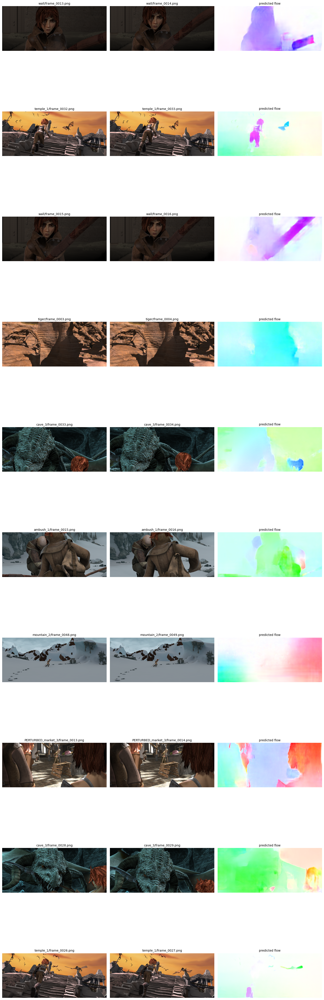

In [ ]:
# Display a few random samples and their predictions
img_pairs, pred_labels, ids = ds.get_samples(num_samples, split='test_with_preds', deterministic=False, as_tuple=True)
display_img_pairs_w_flows(img_pairs, pred_labels, titles=ids)

Evaluation Part(Through End Point Error)


In [ ]:
"""
pwcnet_eval.ipynb

PWC-Net model evaluation.

Written by Phil Ferriere

Licensed under the MIT License (see LICENSE for details)
"""
from __future__ import absolute_import, division, print_function
import sys
from copy import deepcopy
import pandas as pd
import seaborn as sns

from dataset_base import _DEFAULT_DS_VAL_OPTIONS
from dataset_mpisintel import MPISintelDataset
from model_pwcnet import ModelPWCNet, _DEFAULT_PWCNET_VAL_OPTIONS
from visualize import display_img_pairs_w_flows

%matplotlib inline

In [ ]:
# TODO: You MUST set dataset_root to the correct path on your machine!
if sys.platform.startswith("win"):
    _DATASET_ROOT = 'E:/datasets/'
else:
    _DATASET_ROOT = '/content/VBOF_publish/'
_MPISINTEL_ROOT = _DATASET_ROOT + 'MPI-Sintel'

# TODO: Set device on which to perform the evaluation
gpu_devices = ['/device:GPU:0'] # We're doing the evaluation on a single GPU
controller = '/device:GPU:0'

# More options...
mode = 'val_notrain'            # We're doing evaluation using the entire dataset for evaluation
num_samples = 10                # Number of samples for error analysis
ckpt_path = './PWCNet_OFDark/pwcnet.ckpt-50000' # Model to eval

In [ ]:
# Load the dataset in evaluation mode, starting with the default evaluation options
ds_opts = deepcopy(_DEFAULT_DS_VAL_OPTIONS)
ds_opts['type'] = 'clean'
ds = MPISintelDataset(mode='val_notrain', ds_root=_MPISINTEL_ROOT, options=ds_opts)
ds.print_config()


Dataset Configuration:
  verbose              False
  in_memory            False
  crop_preproc         None
  scale_preproc        None
  type                 clean
  random_seed          1969
  val_split            0.03
  aug_type             None
  mode                 val_notrain


In [ ]:
# Configure the model for evaluation, starting with the default evaluation options
nn_opts = deepcopy(_DEFAULT_PWCNET_VAL_OPTIONS)
nn_opts['verbose'] = True
nn_opts['ckpt_path'] = ckpt_path
nn_opts['batch_size'] = 1               # Setting this to 1 leads to more accurate evaluations of the processing time
nn_opts['use_tf_data'] = False          # Don't use tf.data reader for this simple task
nn_opts['gpu_devices'] = gpu_devices
nn_opts['controller'] = controller      # Evaluate on CPU or GPU?

# We're evaluating the PWC-Net-small model in quarter-resolution mode
# That is, with a 6 level pyramid, and uspampling of level 2 by 4 in each dimension as the final flow prediction
nn_opts['use_dense_cx'] = True
nn_opts['use_res_cx'] = True
nn_opts['pyr_lvls'] = 6
nn_opts['flow_pred_lvl'] = 2

# The size of the images in this dataset are not multiples of 64, while the model generates flows padded to multiples
# of 64. Hence, we need to crop the predicted flows to their original size
nn_opts['adapt_info'] = (1, 436, 1024, 2)

In [ ]:
# Instantiate the model in evaluation mode and display the model configuration
nn = ModelPWCNet(mode='val_notrain', options=nn_opts, dataset=ds)
nn.print_config()

debug msg 1
1
Building model...


/content/model_pwcnet.py:1098: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  x = tf.layers.conv2d(x, f, 3, 2, 'same', kernel_initializer=init, name=f'conv{lvl}a', reuse=reuse)
/content/model_pwcnet.py:1100: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  x = tf.layers.conv2d(x, f, 3, 1, 'same', kernel_initializer=init, name=f'conv{lvl}aa', reuse=reuse)
/content/model_pwcnet.py:1102: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  x = tf.layers.conv2d(x, f, 3, 1, 'same', kernel_initializer=init, name=f'conv{lvl}b', reuse=reuse)
/content/model_pwcnet.py:1430: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  conv = tf.layers.conv2d(x, 128, 3, 1, 'sam

... model built.
Loading model checkpoint ./PWCNet_OFDark/pwcnet.ckpt-50000 for eval or testing...

... model loaded

Model Configuration:
  verbose                True
  ckpt_path              ./PWCNet_OFDark/pwcnet.ckpt-50000
  x_dtype                <dtype: 'float32'>
  x_shape                [2, None, None, 3]
  y_dtype                <dtype: 'float32'>
  y_shape                [None, None, 2]
  adapt_info             (1, 436, 1024, 2)
  sparse_gt_flow         False
  gpu_devices            ['/device:GPU:0']
  controller             /device:GPU:0
  batch_size             1
  use_tf_data            False
  use_mixed_precision    False
  pyr_lvls               6
  flow_pred_lvl          2
  search_range           4
  use_dense_cx           True
  use_res_cx             True
  mode                   val_notrain
  trainable params       14079050


In [ ]:
# Evaluate the performance of the model on the dataset
# Save the predictions to disk for error analysis
# Also, get a panda dataframe with info about each sample for further error analysis
avg_metric, avg_duration, df = nn.eval(metric_name='EPE', save_preds=True)

Measuring EPE and saving preds: 100%|###########################| 1041/1041 [05:16<00:00,  3.29it/s]


In [ ]:
print(f'Average EPE={avg_metric:.2f}, mean inference time={avg_duration*1000.:.2f}ms')

Average EPE=4.98, mean inference time=100.37ms


In [ ]:
# Which are the 10 best performers with an average flow magnitude?
mean_avg_flow_mag = df['Avg_Flow_Mag'].mean()
df_best = df[df['Avg_Flow_Mag'] >= mean_avg_flow_mag].sort_values(by='EPE').head(int(num_samples))
df_best

,ID,EPE,Duration,Avg_Flow_Mag,Max_Flow_Mag
302,cave_2/frames_0044_0045,1.351947,0.101135,16.674301,24.896103
524,cave_2/frames_0043_0044,1.490843,0.088053,23.422258,39.286705
607,cave_2/frames_0045_0046,1.730939,0.101032,12.031259,18.390833
130,cave_4/frames_0027_0028,1.977212,0.089046,12.208645,44.401886
440,cave_2/frames_0047_0048,1.988187,0.086132,12.463686,33.081768
666,market_5/frames_0040_0041,1.988981,0.095940,24.336782,67.767738
908,cave_4/frames_0022_0023,2.050475,0.086643,13.132544,25.238388
888,cave_2/frames_0042_0043,2.057623,0.088363,31.624296,44.993580
74,temple_3/frames_0017_0018,2.098910,0.085997,13.246318,52.352272
638,temple_3/frames_0016_0017,2.153418,0.086658,12.560707,92.365913


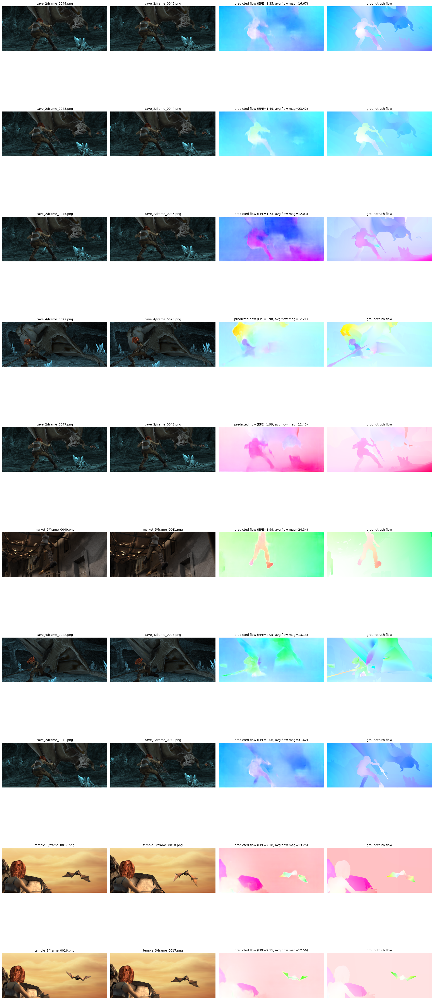

In [ ]:
# How do the 10 best performers (with average flow mag) look like?
images, labels, pred_labels, ids = ds.get_samples_by_flow_ID(list(df_best['ID']), split='val_with_preds')
info_text = [f"(EPE={stat[0]:.2f}, avg flow mag={stat[1]:.2f})" for stat in zip(df_best['EPE'], df_best['Avg_Flow_Mag'])]
display_img_pairs_w_flows(images, pred_labels, labels, ids, info_text)

In [ ]:
# Which are the 10 worst performers by EPE?
df = df.sort_values(by='EPE')
df_worst = df.tail(num_samples).iloc[::-1]
df_worst

,ID,EPE,Duration,Avg_Flow_Mag,Max_Flow_Mag
116,ambush_4/frames_0004_0005,91.930038,0.095062,53.479958,175.120697
741,ambush_6/frames_0015_0016,89.674065,0.087853,54.226685,211.732742
45,ambush_4/frames_0005_0006,89.504532,0.087344,54.195782,184.320343
584,ambush_2/frames_0015_0016,67.824287,0.086836,66.268768,208.142502
41,ambush_2/frames_0004_0005,61.443584,0.088068,63.579365,191.965714
280,cave_2/frames_0025_0026,54.637688,0.086269,56.859249,110.886742
433,ambush_5/frames_0047_0048,48.511162,0.093402,53.227112,208.673874
869,ambush_4/frames_0007_0008,48.409420,0.105744,41.970398,119.391853
806,ambush_2/frames_0003_0004,48.041908,0.089695,63.366631,150.776215
304,ambush_2/frames_0005_0006,46.703289,0.091333,57.418037,164.064072


from matplotlib import pyplot as plt
df_worst['EPE'].plot(kind='hist', bins=20, title='EPE')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_worst['Duration'].plot(kind='hist', bins=20, title='Duration')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_worst['Avg_Flow_Mag'].plot(kind='hist', bins=20, title='Avg_Flow_Mag')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_worst['Max_Flow_Mag'].plot(kind='hist', bins=20, title='Max_Flow_Mag')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_worst.plot(kind='scatter', x='EPE', y='Duration', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_worst.plot(kind='scatter', x='Duration', y='Avg_Flow_Mag', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_worst.plot(kind='scatter', x='Avg_Flow_Mag', y='Max_Flow_Mag', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_worst['EPE'].plot(kind='line', figsize=(8, 4), title='EPE')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
df_worst['Duration'].plot(kind='line', figsize=(8, 4), title='Duration')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
df_worst['Avg_Flow_Mag'].plot(kind='line', figsize=(8, 4), title='Avg_Flow_Mag')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
df_worst['Max_Flow_Mag'].plot(kind='line', figsize=(8, 4), title='Max_Flow_Mag')
plt.gca().spines[['top', 'right']].set_visible(False)

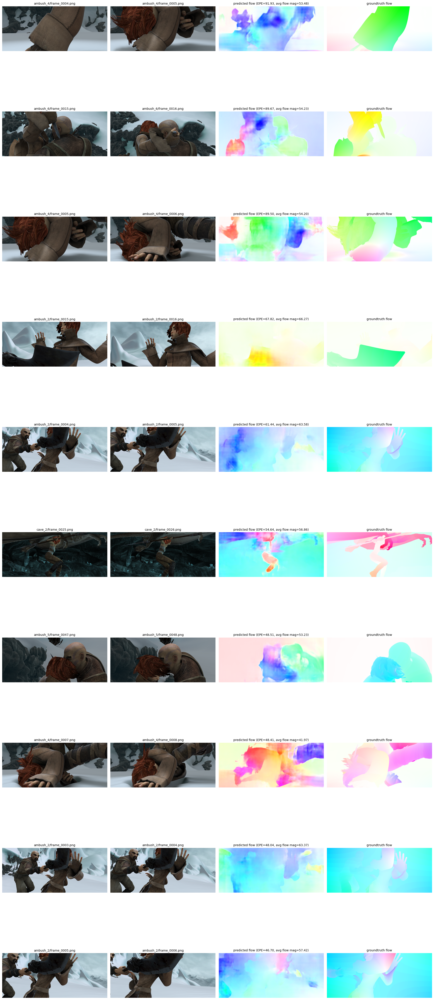

In [ ]:
# How do the 10 worst performers look like?
images, labels, pred_labels, ids = ds.get_samples_by_flow_ID(list(df_worst['ID']), split='val_with_preds')
info_text = [f"(EPE={stat[0]:.2f}, avg flow mag={stat[1]:.2f})" for stat in zip(df_worst['EPE'], df_worst['Avg_Flow_Mag'])]
display_img_pairs_w_flows(images, pred_labels, labels, ids, info_text)